### Exploratory Data Analysis

In [111]:
import numpy as np
import pandas as pd
import os
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import pytz

from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import MinMaxScaler

import plotly.express as px

mpl.rcParams['figure.figsize'] = (18,12)
mpl.rcParams['axes.grid'] = False
from matplotlib.axes._axes import _log as matplotlib_axes_logger
matplotlib_axes_logger.setLevel('ERROR')
sns.set()

### Features of the data 

https://climate.weather.gc.ca/glossary_e.html#s <br>

$\textit{timestamp: }$ The date along with the time of the day the data was collected  <br>
$\textit{unixtime: }$ A system for describing a point in time <br>
$\textit{pressure_station: }$ The true pressure of the location recorded at the station in kilopascals (kPa) <br>
$\textit{pressure_sea: }$ The pressure at sea level in kilopascals (kPa) <br>
$\textit{wind_dir: }$ The direction of the wind <br>
$\textit{wind_dir_10: }$ Represented in 10s of degrees <br>
$\textit{wind_speed: }$ Speed of the motion of air in kilometres per hour (km/h) <br>
$\textit{wind_gust: }$ Sudden burst in wind speed in kilometres per hour (km/h) usually lasts for 20 seconds or under <br>
$\textit{relative_humidity: }$ Describes the amount of water vapour held in the air <br>
$\textit{dew_point: }$ The temperature in Celsius to which the air must be cooled before dew or frost begins to form  <br>
$\textit{temperature: }$ The current temperature of the air recorded at the station in Celsius <br>
$\textit{windchill: }$ Wind chill is an index to indicate how cold the weather feels to the average person <br>
$\textit{humidex: }$ Humidex is an index to indicate how hot or humid the weather feels to the average person <br>
$\textit{visibility: }$ Visibility in kilometres (km) is the distance at which objects of suitable size can be seen <br>
$\textit{health_index: }$ Scale designed to help you understand what the air quality around you means to your health <br>
$\textit{cloud_cover_4: }$ Measures the cloud cover <br>
$\textit{cloud_cover_8: }$ Measures the cloud cover <br>
$\textit{cloud_cover_10: }$ Measures the cloud cover <br>
$\textit{solar_radiation: }$ Solar radiation is the measurement of radiant energy from the sun <br>
$\textit{max_air_temp_pst1hr: }$ Maximum air temperature in the past one hour <br>
$\textit{min_air_temp_pst1hr: }$ Minimum air temperature in the past one hour <br>
$\textit{demand: }$ The electrical demand on hourly basis for the city of Toronto (MWhr) <br>

In [2]:
data = pd.read_csv('Data/Toronto_data.csv')
display(data.head())

,timestamp,unixtime,pressure_station,pressure_sea,wind_dir,wind_dir_10s,wind_speed,wind_gust,relative_humidity,dew_point,...,humidex,visibility,health_index,cloud_cover_4,cloud_cover_8,cloud_cover_10,solar_radiation,max_air_temp_pst1hr,min_air_temp_pst1hr,demand
0,2017-01-01 00,1483246800,98.67,100.79,W,26.0,35.0,45.0,69.0,-4.5,...,NaN,24100.0,NaN,NaN,7.0,NaN,NaN,0.9,0.3,5665
1,2017-01-01 01,1483250400,98.83,100.95,W,26.0,35.0,NaN,70.0,-4.5,...,NaN,24100.0,NaN,NaN,7.0,NaN,NaN,0.6,0.2,5665
2,2017-01-01 02,1483254000,98.95,101.08,W,26.0,32.0,43.0,67.0,-5.4,...,NaN,24100.0,2.3,NaN,7.0,NaN,NaN,0.3,-0.1,5665
3,2017-01-01 03,1483257600,99.14,101.27,W,26.0,28.0,NaN,69.0,-5.1,...,NaN,24100.0,2.3,NaN,7.0,NaN,NaN,0.0,-0.2,5665
4,2017-01-01 04,1483261200,99.28,101.41,W,26.0,27.0,NaN,69.0,-5.1,...,NaN,24100.0,2.2,NaN,7.0,NaN,NaN,-0.1,-0.3,5665


I am particularly interested in predicting the electrical demand data. Temperature of the surrounding air, for obvious reasons, affects the electrical demand. We can drop the remaining columns and use the date_time_local as a datetime object to index the data frame.

In [3]:
data.drop(['unixtime','pressure_station','pressure_sea','wind_dir', 'wind_dir_10s', 'wind_speed', 'wind_gust','dew_point',
           'windchill','visibility', 'health_index', 'cloud_cover_4', 'cloud_cover_8', 'cloud_cover_10', 'solar_radiation',
            'humidex','relative_humidity','max_air_temp_pst1hr','min_air_temp_pst1hr'],axis=1,inplace=True)

display(data.head())

,timestamp,temperature,demand
0,2017-01-01 00,0.5,5665
1,2017-01-01 01,0.3,5665
2,2017-01-01 02,0.0,5665
3,2017-01-01 03,-0.1,5665
4,2017-01-01 04,-0.1,5665


In [4]:
data['timestamp'] = pd.to_datetime(data['timestamp'])

data_noindex = data.copy()
data = data.set_index('timestamp')

display(data.head())

,temperature,demand
timestamp,,
2017-01-01 00:00:00,0.5,5665
2017-01-01 01:00:00,0.3,5665
2017-01-01 02:00:00,0.0,5665
2017-01-01 03:00:00,-0.1,5665
2017-01-01 04:00:00,-0.1,5665


### Handling missing values

Let's check the number of missing data points in the temperature and demand data. Looks like IESO has been doing a good job maintaing their demand data. And there are only 7 missing data points in the temperature data too. We will fix these shortly.

In [5]:
display(pd.DataFrame({'Missing Values':data.isna().sum(),'Percentage':data.isna().sum()*100/data.shape[0]}))

,Missing Values,Percentage
temperature,7,0.019721
demand,0,0.000000


Let us take a look at the missing values in the temperature and fix them. We can observe that the missing values are not continuous and therefore, we could use forward fill to fill in these missing data points.

In [6]:
display(data.query('temperature != temperature'))

,temperature,demand
timestamp,,
2017-06-10 01:00:00,NaN,4509
2017-11-08 12:00:00,NaN,5972
2018-07-07 01:00:00,NaN,4614
2018-07-07 02:00:00,NaN,4389
2018-09-09 04:00:00,NaN,3705
2019-05-13 19:00:00,NaN,6040
2020-06-11 00:00:00,NaN,5528


In [7]:
data['temperature'] = data['temperature'].fillna(method='ffill')
display(data['temperature'].isna().sum())

0

### Temperature Time series visualization

In [8]:
fig = px.line(data_noindex, x='timestamp',y='temperature',title='Temperature')

fig.update_xaxes(
rangeslider_visible = True,
rangeselector=dict(
buttons=list([
    dict(step='all'),
    dict(count=2, label='2y',step='year',stepmode='backward'),
    dict(count=1, label='1y',step='year',stepmode='backward'),
    dict(count=6, label='6m',step='month',stepmode='backward'),
    dict(count=1, label="YTD", step="year", stepmode="todate")
])))
fig.show()

We can see a strong correlation between the current temperature and the temperature of the previous hour (a lag of 1). Similarly a strong correlation can also be seen with a lag of 2. As we increase the lag, the correlation decreases.

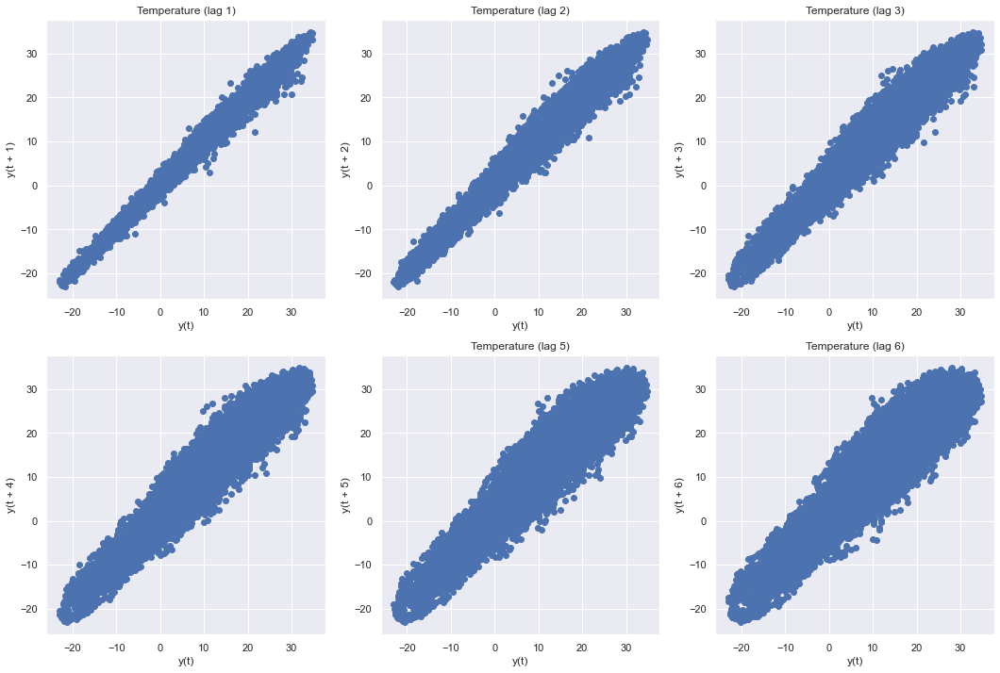

In [276]:
fig, axes = plt.subplots(nrows=2, ncols=3)

pd.plotting.lag_plot(data['temperature'],lag=1,ax=axes[0,0]);
axes[0,0].set_title('Temperature (lag 1)');
pd.plotting.lag_plot(data['temperature'],lag=2,ax=axes[0,1]);
axes[0,1].set_title('Temperature (lag 2)');
pd.plotting.lag_plot(data['temperature'],lag=3,ax=axes[0,2]);
axes[0,2].set_title('Temperature (lag 3)');
pd.plotting.lag_plot(data['temperature'],lag=4,ax=axes[1,0]);
axes[1,1].set_title('Temperature (lag 4)');
pd.plotting.lag_plot(data['temperature'],lag=5,ax=axes[1,1]);
axes[1,1].set_title('Temperature (lag 5)');
pd.plotting.lag_plot(data['temperature'],lag=6,ax=axes[1,2]);
axes[1,2].set_title('Temperature (lag 6)');

For a lag of 24, we can observe a positive correlation. As we increase the lag to 8766 (the number of hours in a year 356$*$24+6) we can still see a positive correlation. This indicates a daily and an yearly seasonality of the data. As we go to half a year, we can observe a negative correlation. For a quaterly lag, there is no correlation what so ever. 

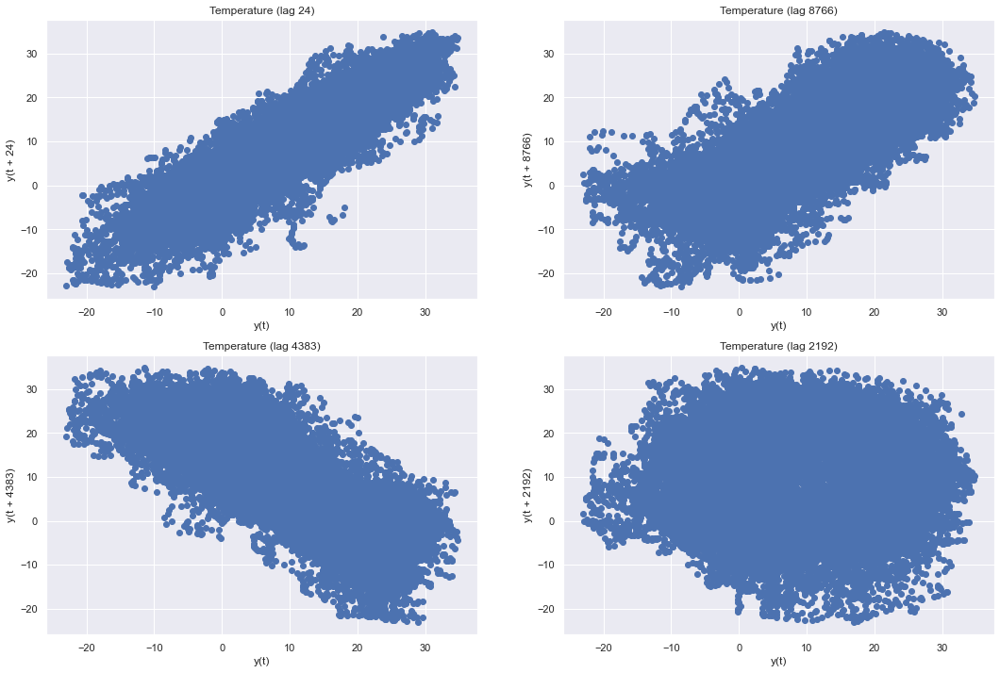

In [10]:
fig, axes = plt.subplots(nrows=2, ncols=2)

pd.plotting.lag_plot(data['temperature'],lag=24,ax=axes[0,0]);
axes[0,0].set_title('Temperature (lag 24)');
pd.plotting.lag_plot(data['temperature'],lag=8766,ax=axes[0,1]);
axes[0,1].set_title('Temperature (lag 8766)');
pd.plotting.lag_plot(data['temperature'],lag=4383,ax=axes[1,0]);
axes[1,0].set_title('Temperature (lag 4383)');
pd.plotting.lag_plot(data['temperature'],lag=2192,ax=axes[1,1]);
axes[1,1].set_title('Temperature (lag 2192)');

### Electrical Demand Time series visualization

In [11]:
fig = px.line(data_noindex, x='timestamp',y='demand',title='Demand')

fig.update_xaxes(
rangeslider_visible = True,
rangeselector=dict(
buttons=list([
    dict(step='all'),
    dict(count=2, label='2y',step='year',stepmode='backward'),
    dict(count=1, label='1y',step='year',stepmode='backward'),
    dict(count=6, label='6m',step='month',stepmode='backward'),
    dict(count=1, label="YTD", step="year", stepmode="todate")
])))
fig.show()

We can see from the plots below that electrical demand is much less dependent on the previous time step than temperature.

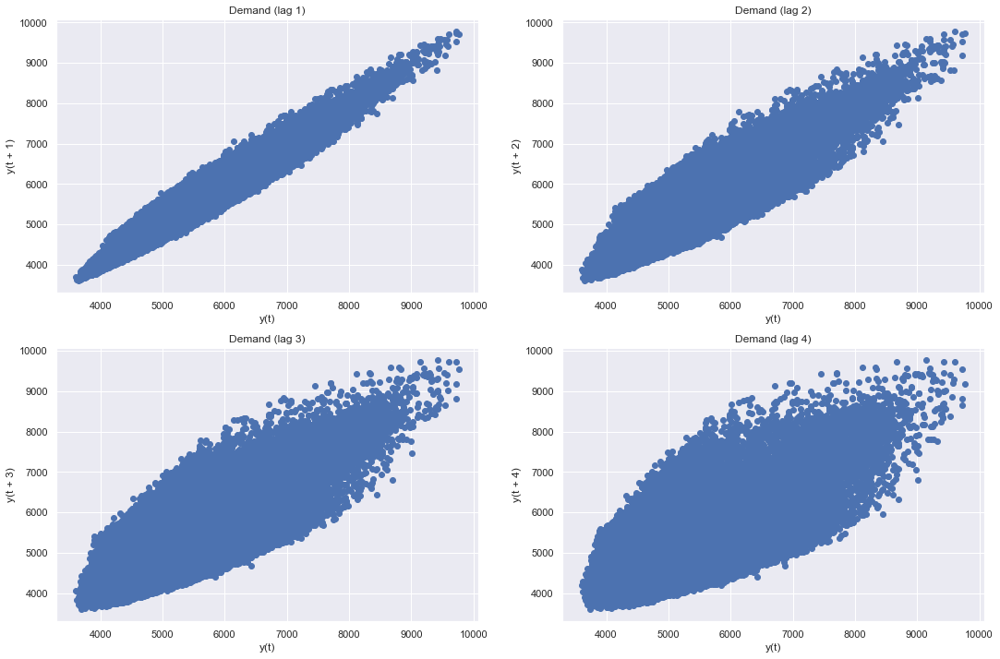

In [278]:
fig, axes = plt.subplots(nrows=2, ncols=2)

pd.plotting.lag_plot(data['demand'],lag=1,ax=axes[0,0]);
axes[0,0].set_title('Demand (lag 1)');
pd.plotting.lag_plot(data['demand'],lag=2,ax=axes[0,1]);
axes[0,1].set_title('Demand (lag 2)');
pd.plotting.lag_plot(data['demand'],lag=3,ax=axes[1,0]);
axes[1,0].set_title('Demand (lag 3)');
pd.plotting.lag_plot(data['demand'],lag=4,ax=axes[1,1]);
axes[1,1].set_title('Demand (lag 4)');

Electrical demand is positively correlated with its previous days data. Unlike temperature, the electrical demand does not have a natural yearly seasonality. This is because the demand is typically higher on weekends compared to weekdays. To find a middle ground, we can use 52$*$7$*$24 = 8736 as the seasonality for both the temperature and the electrical demand. 

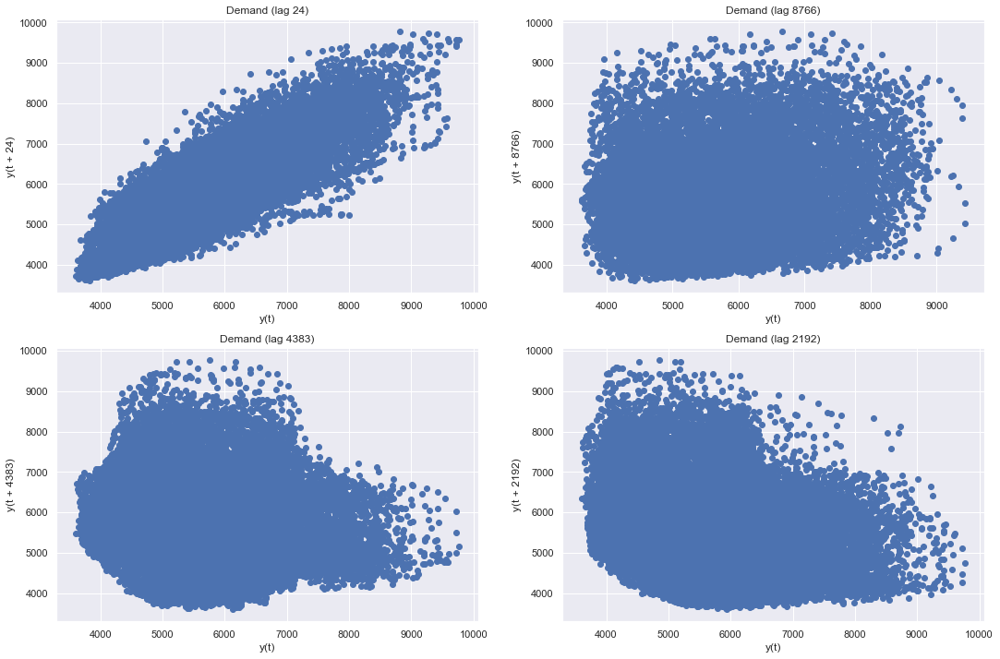

In [13]:
fig, axes = plt.subplots(nrows=2, ncols=2)

pd.plotting.lag_plot(data['demand'],lag=24,ax=axes[0,0]);
axes[0,0].set_title('Demand (lag 24)');
pd.plotting.lag_plot(data['demand'],lag=8766,ax=axes[0,1]);
axes[0,1].set_title('Demand (lag 8766)');
pd.plotting.lag_plot(data['demand'],lag=4383,ax=axes[1,0]);
axes[1,0].set_title('Demand (lag 4383)');
pd.plotting.lag_plot(data['demand'],lag=2192,ax=axes[1,1]);
axes[1,1].set_title('Demand (lag 2192)');

With a new seasonality of 8736, we can see a positive correlation for both temperature and the demand data.

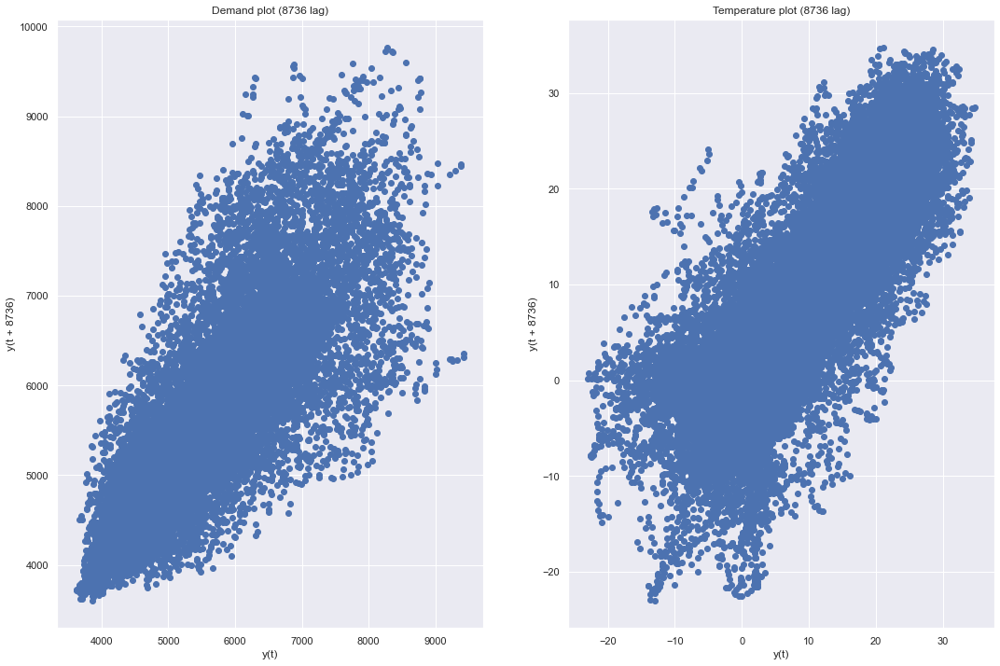

In [14]:
fig, axes = plt.subplots(nrows=1, ncols=2)

pd.plotting.lag_plot(data['demand'],lag=8736,ax=axes[0]);
axes[0].set_title('Demand plot (8736 lag)');
pd.plotting.lag_plot(data['temperature'],lag=8736,ax=axes[1]);
axes[1].set_title('Temperature plot (8736 lag)');

### Relationship between Temperature and Electrical Demand

We can see a strong influence of temperature on the electrical demand data. In the summer months, when temperature is pretty high, the air conditioner and cooling power contributes to a higher demand in electricity.

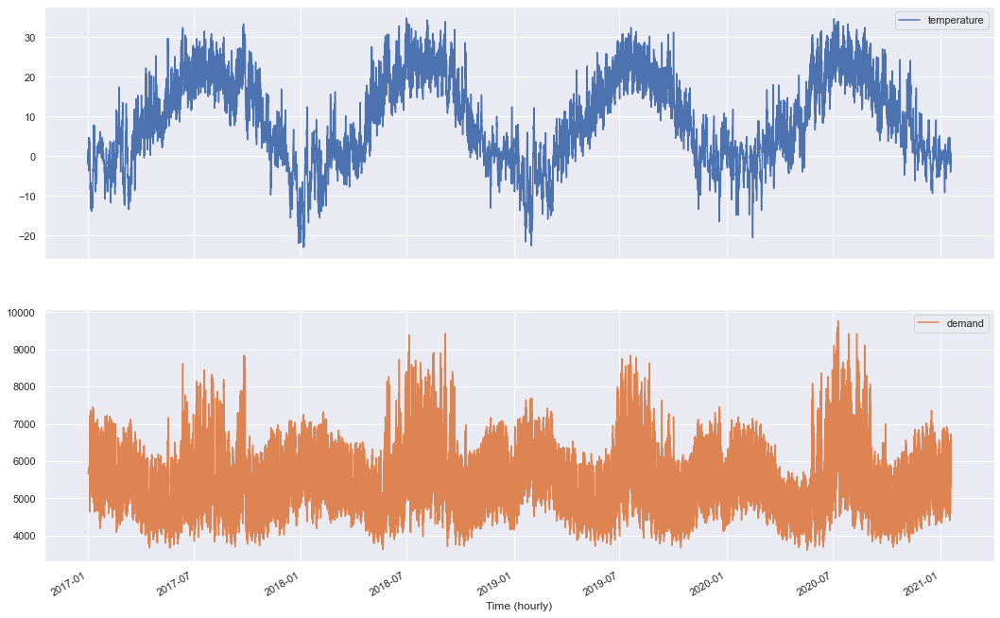

In [15]:
data.plot(subplots=True)
plt.xlabel('Time (hourly)');

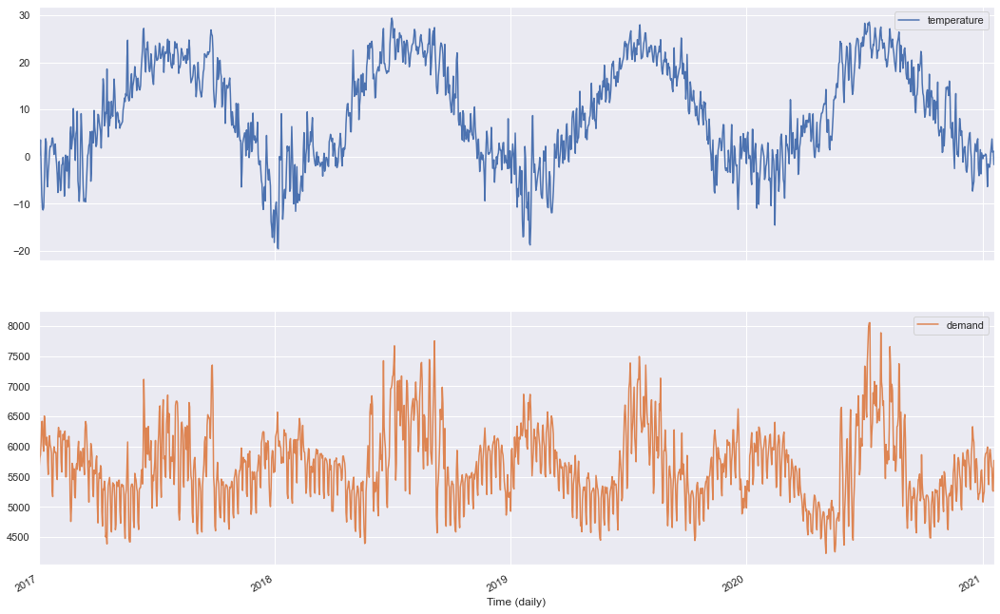

In [16]:
data.resample('D').mean().plot(subplots=True);
plt.xlabel('Time (daily)');

A monthly average plot of demand and temperature are shown below. We can right away pick up the summer peaks and the relationship between the two.

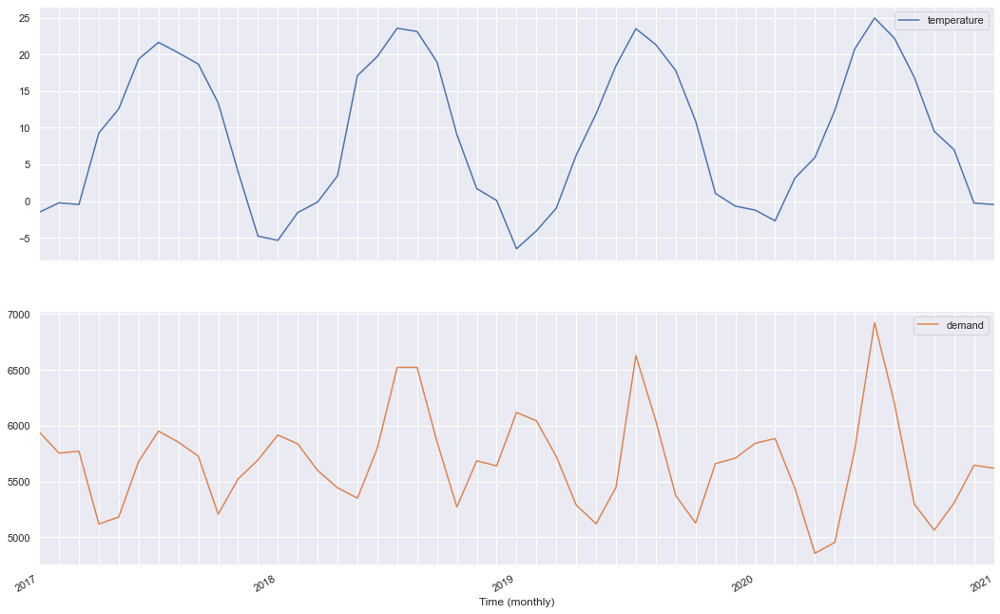

In [17]:
data.resample('M').mean().plot(subplots=True);
plt.xlabel('Time (monthly)');
plt.xticks(data.resample('M').mean().index);

The first plot shows the general correlation between electrical demand and temperature. We can see that there is no strong correlation between them. This makes sense as we expect the demand to be higher in the summer (high temperature) and slightly higher in the winter (lower temperature). If we look at the data when the temperature is high (>15), we can see a strong positive correlation. During winter, when the temperatures are lower, people tend to use boilers for heaeting and not electricity. Still, we see a mild negative correlation. This could possibly stem from the fact that people tend to stay home longer in the winter and tend to use more electricity. During shoulder season, when the temperatures are between 0 and 15, we can still see a slightly higher negative correlation. This is because as the temperature increase, people spend less time at home, but its not hot enough to turn on the air conditioner.   

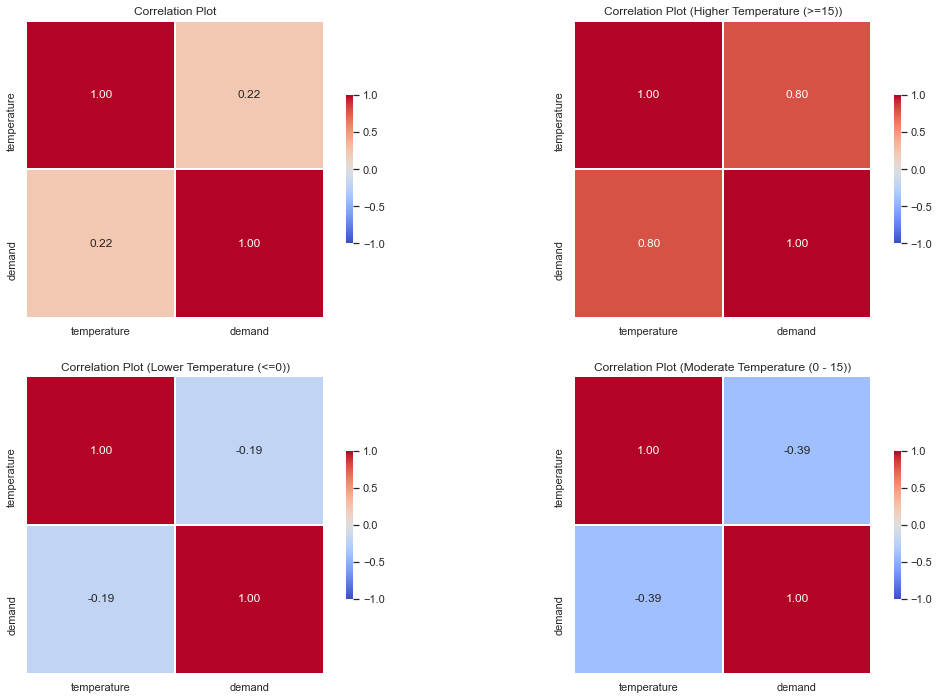

In [18]:
fig, axes = plt.subplots(nrows=2, ncols=2)

sns.heatmap(data.corr(method='pearson'), vmax = 1, vmin=-1, center=0,
               square=True, linewidth=0.5, cbar_kws={"shrink":0.5}, annot=True, fmt=".2f", cmap="coolwarm", ax=axes[0,0]);
axes[0,0].set_title('Correlation Plot');
sns.heatmap(data.query('temperature >= 15').corr(method='pearson'), vmax = 1, vmin=-1, center=0,
               square=True, linewidth=0.5, cbar_kws={"shrink":0.5}, annot=True, fmt=".2f", cmap="coolwarm", ax=axes[0,1]);
axes[0,1].set_title('Correlation Plot (Higher Temperature (>=15))');
sns.heatmap(data.query('temperature <= 0').corr(method='pearson'), vmax = 1, vmin=-1, center=0,
               square=True, linewidth=0.5, cbar_kws={"shrink":0.5}, annot=True, fmt=".2f", cmap="coolwarm", ax=axes[1,0]);
axes[1,0].set_title('Correlation Plot (Lower Temperature (<=0))');
sns.heatmap(data.query('temperature > 0' and 'temperature < 15').corr(method='pearson'), vmax = 1, vmin=-1, center=0,
               square=True, linewidth=0.5, cbar_kws={"shrink":0.5}, annot=True, fmt=".2f", cmap="coolwarm", ax=axes[1,1]);
axes[1,1].set_title('Correlation Plot (Moderate Temperature (0 - 15))');

### Various factors considered for the Electrical demand

We split the data set into various categories based on the domain knowledge of factors affecting the electrical demand

$\textit{Temperature: }$ Based on the above analysis we split it into "Hot" (>15 degrees) and "NotHot" (<15 degrees) <br>
$\textit{Time of the day: }$ Split into "AwakeHours" (7am to 10pm) and "SleepHours" (10pm to 7am) <br>
$\textit{Type of the day: }$ Split into "Weekend" and "Weekday" <br> 
$\textit{Pandemic effects: }$ We can look at the information available at https://en.wikipedia.org/wiki/COVID-19_pandemic_in_Ontario#Lifting_of_restrictions_after_the_first_wave to look at different stages of lockdown.

In [162]:
def temp_15(x):
    if x > 15:
        return 'Hot'
    else:
        return 'NotHot'
    
def peak_(x):
    if x >= 7 and x <= 22:
        return 'AwakeHours'
    else: 
        return 'SleepHours'
    
def weekday_(x):
    if x >= 5:
        return 'Weekend'
    else:
        return 'Weekday'
    
def pandemic_(x):
    if x >= datetime.date(2020,12,21):
        return 'FullLockdown'
    elif x >= datetime.date(2020,10,10):
        return 'ModifiedStageTwo'
    elif x >= datetime.date(2020,7,24):
        return 'StageTwo'
    elif x >= datetime.date(2020,5,14):
        return 'StageOne'
    elif x >= datetime.date(2020,3,20):
        return 'FullLockdown'  
    else:
        return 'NormalDay'

In [163]:
data['year'] = data.index.year
data['month'] = data.index.month
data['dayofweek'] = data.index.dayofweek
data['day'] = data.index.day
data['hour'] = data.index.hour
data['temp_index'] = data['temperature'].apply(temp_15)
data['hour_index'] = data['hour'].apply(peak_)
data['week_index'] = data['dayofweek'].apply(weekday_)
data['day_status'] = [pandemic_(x.date()) for x in data.reset_index()['timestamp']]
display(data.head())

,temperature,demand,year,month,dayofweek,day,hour,temp_index,hour_index,week_index,day_status,adjustedtemp
timestamp,,,,,,,,,,,,
2017-01-01 00:00:00,0.5,5665,2017,1,6,1,0,NotHot,SleepHours,Weekend,NormalDay,0.0
2017-01-01 01:00:00,0.3,5665,2017,1,6,1,1,NotHot,SleepHours,Weekend,NormalDay,0.0
2017-01-01 02:00:00,0.0,5665,2017,1,6,1,2,NotHot,SleepHours,Weekend,NormalDay,0.0
2017-01-01 03:00:00,-0.1,5665,2017,1,6,1,3,NotHot,SleepHours,Weekend,NormalDay,0.0
2017-01-01 04:00:00,-0.1,5665,2017,1,6,1,4,NotHot,SleepHours,Weekend,NormalDay,0.0


In [164]:
mean_sleep = data.query('hour_index == "SleepHours"')['demand'].mean()
mean_awake = data.query('hour_index == "AwakeHours"')['demand'].mean()
print(f" Mean elctricity demand during sleep hours: {mean_sleep} MWhr")
print(f" Mean elctricity demand during awake hours: {mean_awake} MWhr")

 Mean elctricity demand during sleep hours: 4762.8772819472615 MWhr
 Mean elctricity demand during awake hours: 6129.39367816092 MWhr


The mean consumption of electricity is much higher on awake hours compared to sleep hours as expected. In the plot below, We can clearly see a boundary between awake hours and sleep hours

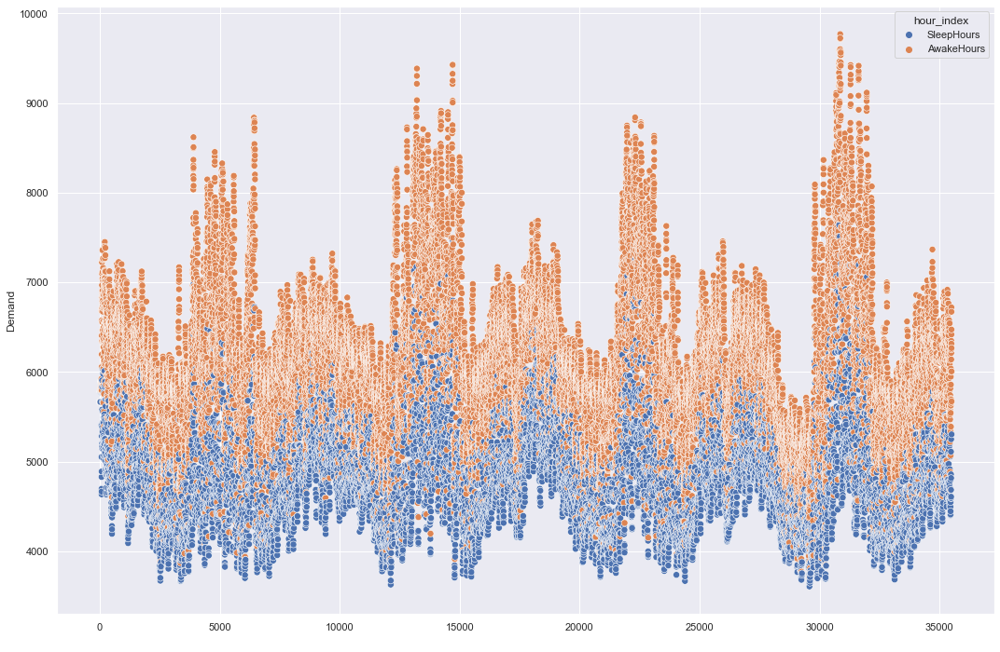

In [165]:
ax = sns.scatterplot(x=data.reset_index().index,y='demand',hue='hour_index',data=data,s=50)
ax.set(xlabel = ' ',ylabel='Demand');

The plot below indicates nothing but the temperatures are hot in summer.

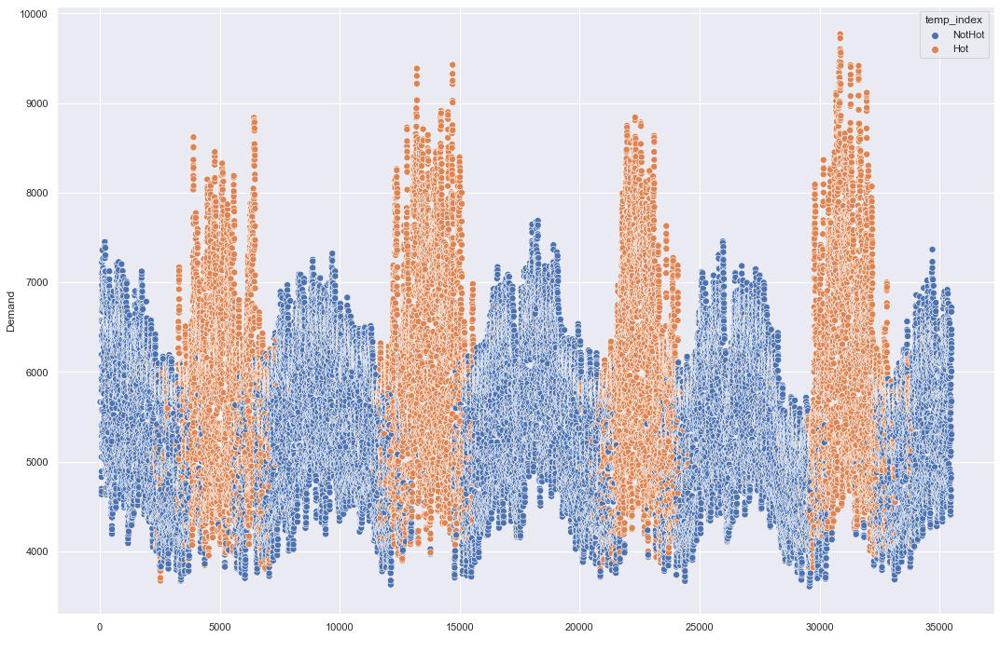

In [166]:
ax = sns.scatterplot(x=data.reset_index().index,y='demand',hue='temp_index',data=data,s=50)
ax.set(xlabel = ' ',ylabel='Demand');

In [167]:
mean_weekend = data.query('week_index == "Weekend"')['demand'].mean()
mean_weekday = data.query('week_index == "Weekday"')['demand'].mean()
print(f" Mean elctricity demand during weekends: {mean_weekend} MWhr")
print(f" Mean elctricity demand during weekdays: {mean_weekday} MWhr")

 Mean elctricity demand during weekends: 5273.492021276596 MWhr
 Mean elctricity demand during weekdays: 5834.274187184344 MWhr


The mean electricity consumption on weekdays are about 600 MWhr higher than that of weekends. 

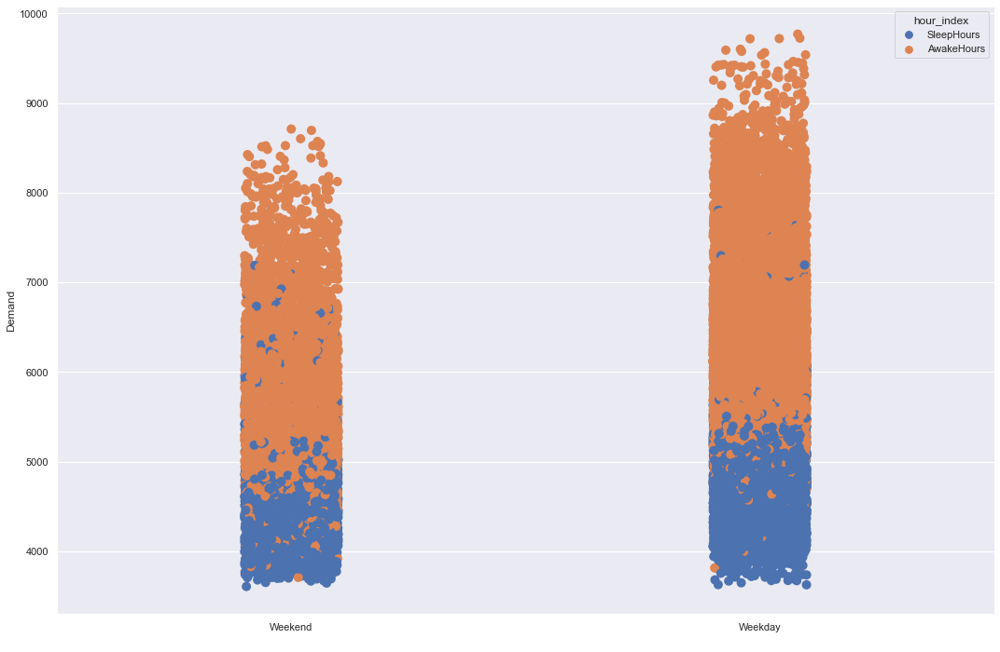

In [168]:
ax = sns.stripplot(x='week_index',y='demand',hue='hour_index',data=data,s=10)
ax.set(xlabel = ' ',ylabel='Demand');

### Effect of Covid-19 Lockdown on demand

In [169]:
normal = data.query('day_status=="NormalDay"')['demand'].mean()
lockdown = data.query('day_status=="FullLockdown"')['demand'].mean()
modified = data.query('day_status=="ModifiedStageTwo"')['demand'].mean()

print(f"Mean electrical demand during a normal day: {normal} MWhr")
print(f"Mean electrical demand during full lockdown: {lockdown} MWhr")
print(f"Mean electrical demand during modified stage two: {modified} MWhr")

Mean electrical demand during a normal day: 5705.5839574090505 MWhr
Mean electrical demand during full lockdown: 5131.798611111111 MWhr
Mean electrical demand during modified stage two: 5359.547137073453 MWhr


We can see that the difference before and after lockdown is roughly 600 MWhr. Based on different stages of lockdown, the varying electricity demands were plotted below. Although, we expect the electricity consumption to be low during lockdown, we shouldn't immediately jump to the conclusion based on this plot alone. We should remember that temperature has an effect on the demand too.

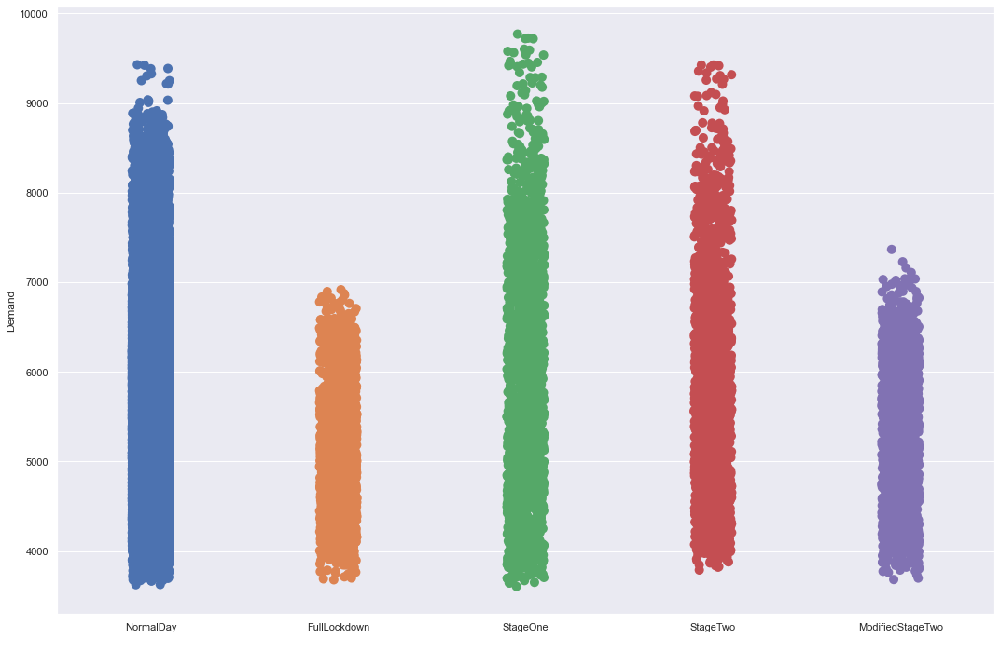

In [170]:
ax = sns.stripplot(x='day_status',y='demand',data=data,s=10)
ax.set(xlabel = ' ',ylabel='Demand');

We can immediately see that, the reason for such a low demand range is because the temperature was low for most of the lockdown period. The demand is higher during stage one and stage two because of the combined effect of staying home and blasting the cooler owing to its high temperatures.

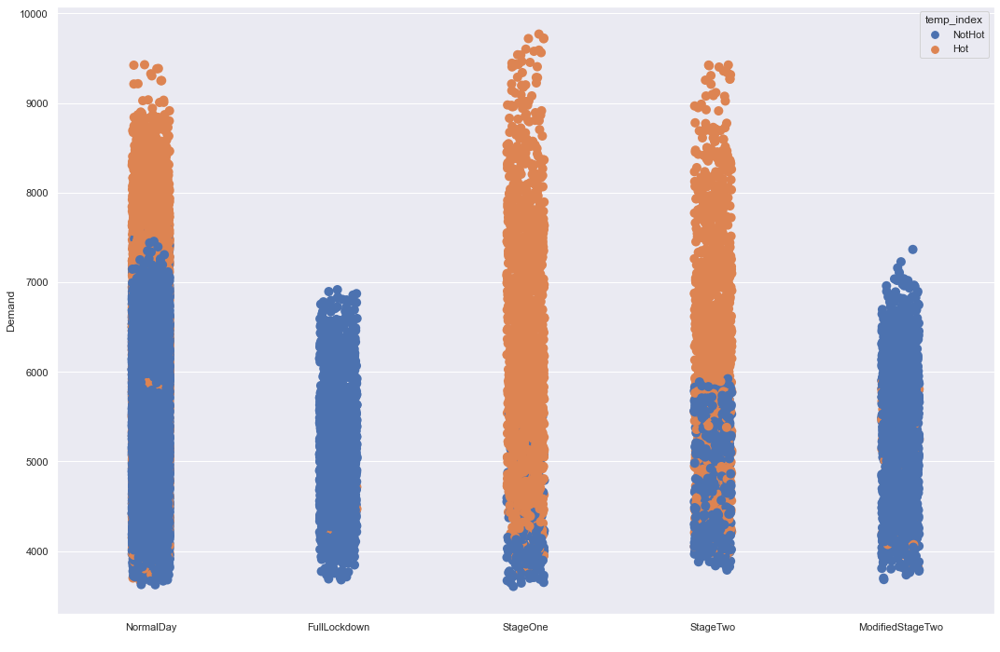

In [171]:
ax = sns.stripplot(x='day_status',y='demand',hue='temp_index',data=data,s=10)
ax.set(xlabel = ' ',ylabel='Demand');

In [172]:
data_select = data[(data['day_status'] == "NormalDay") | (data['day_status'] == "FullLockdown") | (data['day_status'] == "ModifiedStageTwo")]
display(data_select.head())

,temperature,demand,year,month,dayofweek,day,hour,temp_index,hour_index,week_index,day_status,adjustedtemp
timestamp,,,,,,,,,,,,
2017-01-01 00:00:00,0.5,5665,2017,1,6,1,0,NotHot,SleepHours,Weekend,NormalDay,0.0
2017-01-01 01:00:00,0.3,5665,2017,1,6,1,1,NotHot,SleepHours,Weekend,NormalDay,0.0
2017-01-01 02:00:00,0.0,5665,2017,1,6,1,2,NotHot,SleepHours,Weekend,NormalDay,0.0
2017-01-01 03:00:00,-0.1,5665,2017,1,6,1,3,NotHot,SleepHours,Weekend,NormalDay,0.0
2017-01-01 04:00:00,-0.1,5665,2017,1,6,1,4,NotHot,SleepHours,Weekend,NormalDay,0.0


In [173]:
normal_nothot = data_select.query('temp_index == "NotHot" & day_status=="NormalDay"')['demand'].mean()
lockdown_nothot = data_select.query('temp_index == "NotHot" & day_status=="FullLockdown"')['demand'].mean()
modified_nothot = data_select.query('temp_index == "NotHot" & day_status=="ModifiedStageTwo"')['demand'].mean()

print(f"Mean electrical demand during a normal cool day: {normal_nothot} MWhr")
print(f"Mean electrical demand during a cool day during full lockdown: {lockdown_nothot} MWhr")
print(f"Mean electrical demand during a cool day during modified stage two: {modified_nothot} MWhr")

Mean electrical demand during a normal cool day: 5540.1674394099055 MWhr
Mean electrical demand during a cool day during full lockdown: 5135.1694235588975 MWhr
Mean electrical demand during a cool day during modified stage two: 5360.603426395939 MWhr


Therefore, we focus on just the NotHot periods to make a fair comparison. The plot below shows that, the average demand during Covid lockdown and modified stage two are less than that of a normal NotHot day. Because, stage one and stage two lockdown coincided with the summer months, we can just work with three categories (NormalDay, FullLockdown,  ModifiedStageTwo)

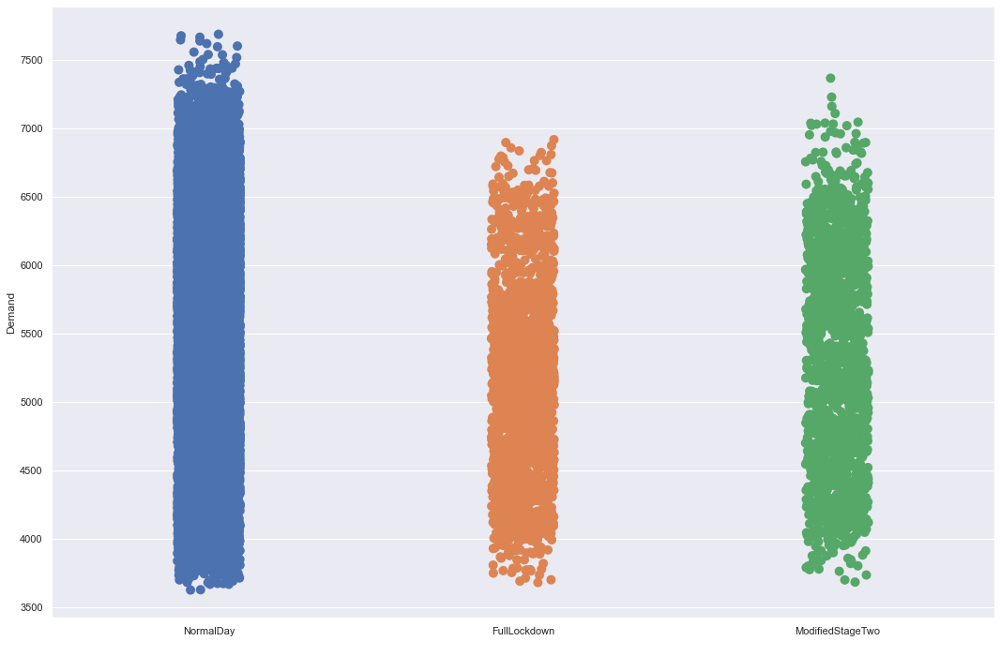

In [174]:
ax = sns.stripplot(x='day_status',y='demand',data=data_select.query('temp_index == "NotHot"'),s=10)
ax.set(xlabel = ' ',ylabel='Demand');

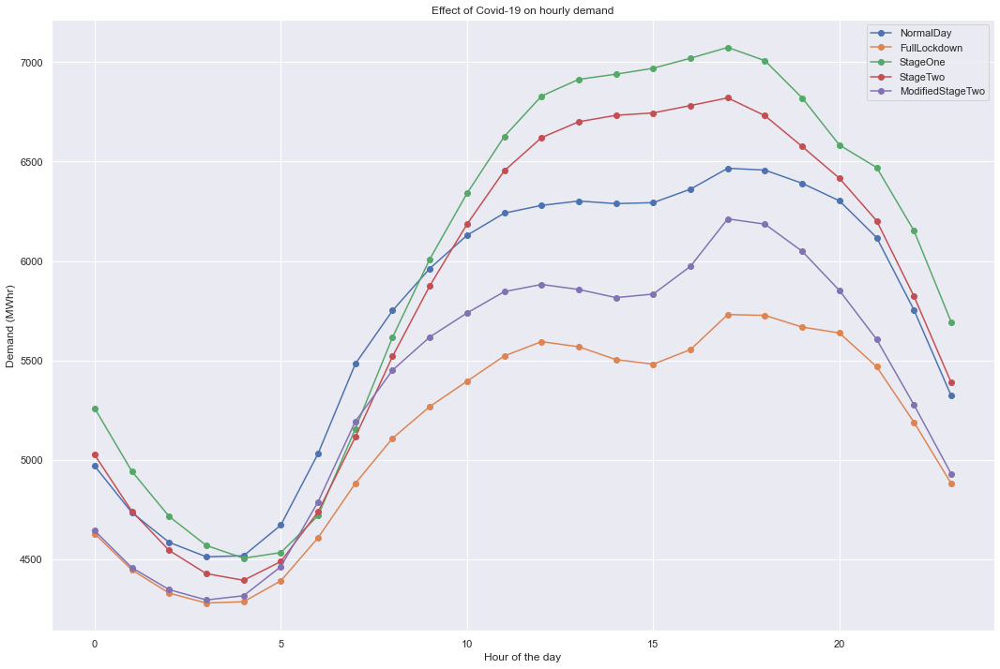

In [175]:
plt.plot(data.query('day_status=="NormalDay"').groupby(['hour'])['demand'].mean(),marker='o',label='NormalDay');
plt.plot(data.query('day_status=="FullLockdown"').groupby(['hour'])['demand'].mean(),marker='o',label='FullLockdown');
plt.plot(data.query('day_status=="StageOne"').groupby(['hour'])['demand'].mean(),marker='o',label='StageOne');
plt.plot(data.query('day_status=="StageTwo"').groupby(['hour'])['demand'].mean(),marker='o',label='StageTwo');
plt.plot(data.query('day_status=="ModifiedStageTwo"').groupby(['hour'])['demand'].mean(),marker='o',label='ModifiedStageTwo');
plt.legend();
plt.ylabel('Demand (MWhr)');
plt.xlabel('Hour of the day');
plt.title('Effect of Covid-19 on hourly demand');

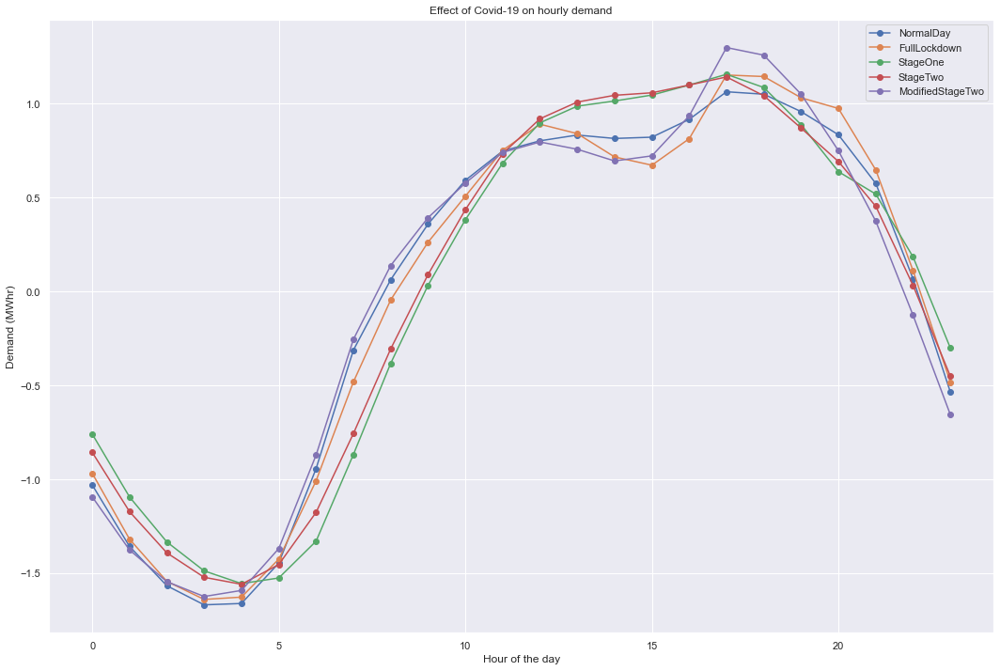

In [207]:
a1 = data.query('day_status=="NormalDay"').groupby(['hour'])['demand'].mean()
a2 = data.query('day_status=="FullLockdown"').groupby(['hour'])['demand'].mean()
a3 = data.query('day_status=="StageOne"').groupby(['hour'])['demand'].mean()
a4 = data.query('day_status=="StageTwo"').groupby(['hour'])['demand'].mean()
a5 = data.query('day_status=="ModifiedStageTwo"').groupby(['hour'])['demand'].mean()

a1 = (a1 - a1.mean())/a1.std()
a2 = (a2 - a2.mean())/a2.std()
a3 = (a3 - a3.mean())/a3.std()
a4 = (a4 - a4.mean())/a4.std()
a5 = (a5 - a5.mean())/a5.std()

plt.plot(a1,marker='o',label='NormalDay');
plt.plot(a2,marker='o',label='FullLockdown');
plt.plot(a3,marker='o',label='StageOne');
plt.plot(a4,marker='o',label='StageTwo');
plt.plot(a5,marker='o',label='ModifiedStageTwo');
plt.legend();
plt.ylabel('Demand (MWhr)');
plt.xlabel('Hour of the day');
plt.title('Effect of Covid-19 on hourly demand');

### Effects of daylight savings time

In [245]:
est = pytz.timezone('US/Eastern')
def dst_index(x):
    if est.localize(x).dst().seconds == 0:
        return "NoDST"
    else:
        return "DST"

In [246]:
data['dst_index'] = [dst_index(x) for x in data.reset_index()['timestamp']]
display(data.head())

,temperature,demand,year,month,dayofweek,day,hour,temp_index,hour_index,week_index,day_status,adjustedtemp,dst_index
timestamp,,,,,,,,,,,,,
2017-01-01 00:00:00,0.5,5665,2017,1,6,1,0,NotHot,SleepHours,Weekend,NormalDay,0.0,NoDST
2017-01-01 01:00:00,0.3,5665,2017,1,6,1,1,NotHot,SleepHours,Weekend,NormalDay,0.0,NoDST
2017-01-01 02:00:00,0.0,5665,2017,1,6,1,2,NotHot,SleepHours,Weekend,NormalDay,0.0,NoDST
2017-01-01 03:00:00,-0.1,5665,2017,1,6,1,3,NotHot,SleepHours,Weekend,NormalDay,0.0,NoDST
2017-01-01 04:00:00,-0.1,5665,2017,1,6,1,4,NotHot,SleepHours,Weekend,NormalDay,0.0,NoDST


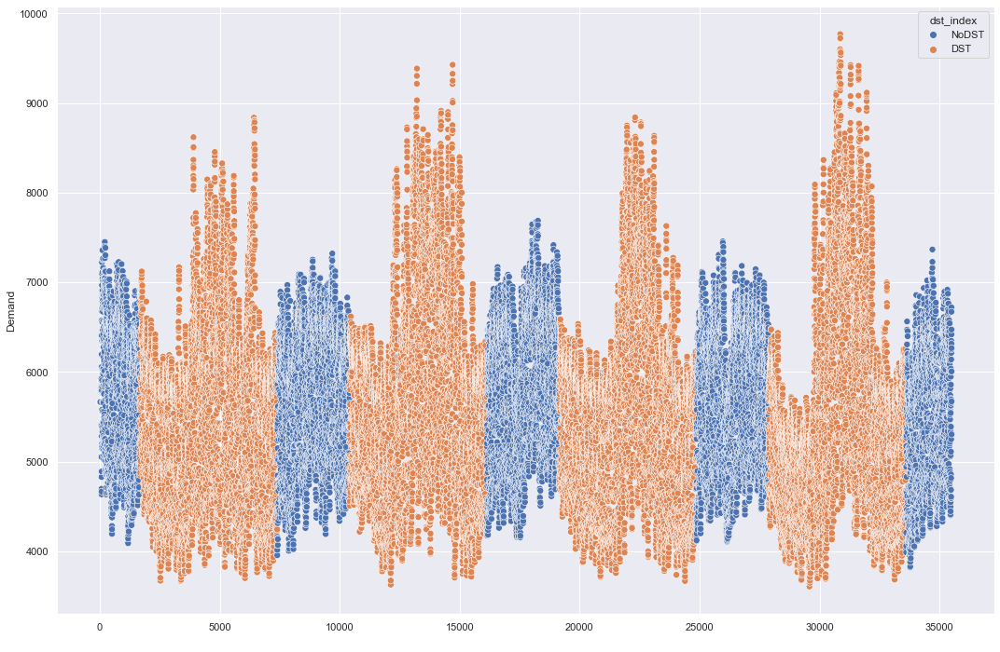

In [267]:
ax = sns.scatterplot(x=data.reset_index().index,y='demand',hue='dst_index',data=data,s=50)
ax.set(xlabel = ' ',ylabel='Demand');

Let's check the mean value of demand before and after daylight sayings. The difference is about 150 MWhr.

In [262]:
x1 = data[data['dst_index'] == "NoDST"]['demand'].mean()
x2 = data[data['dst_index'] == "DST"]['demand'].mean()

print(f"Mean electricity demand with no daylight savings: {x1}")
print(f"Mean electricity demand during daylight savings: {x2}")
print(f"Difference of mean electricity demand with and without daylight savings: {np.abs(x1-x2)}")

Mean electricity demand with no daylight savings: 5769.193548387097
Mean electricity demand during daylight savings: 5621.129901960784
Difference of mean electricity demand with and without daylight savings: 148.06364642631252


In [279]:
x1 = data[(data['day_status'] == "NormalDay") & (data['dst_index'] == "NoDST")]['demand'].mean()
x2 = data[(data['day_status'] == "NormalDay") & (data['dst_index'] == "DST")]['demand'].mean()
x3 = data[(data['day_status'] == "FullLockdown") & (data['dst_index'] == "NoDST")]['demand'].mean()
x4 = data[(data['day_status'] == "FullLockdown") & (data['dst_index'] == "DST")]['demand'].mean()

print(f"Mean electricity demand with no daylight savings during a normal day: {x1}")
print(f"Mean electricity demand during daylight savings during a normal day: {x2}")
print(f"Mean electricity demand with no daylight savings during full lockdown: {x3}")
print(f"Mean electricity demand during daylight savings during full lockdown: {x4}")

Mean electricity demand with no daylight savings during a normal day: 5814.082573925981
Mean electricity demand during daylight savings during a normal day: 5638.607657424947
Mean electricity demand with no daylight savings during full lockdown: 5554.337643678161
Mean electricity demand during daylight savings during full lockdown: 4909.005303030303


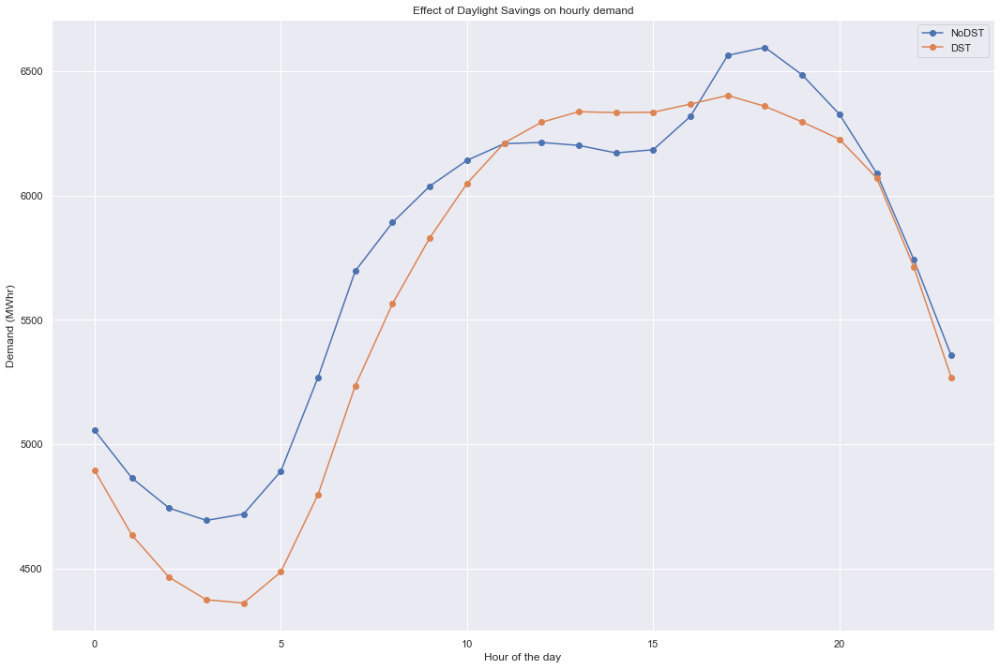

In [271]:
plt.plot(data.query('dst_index=="NoDST"').groupby(['hour'])['demand'].mean(),marker='o',label='NoDST');
plt.plot(data.query('dst_index=="DST"').groupby(['hour'])['demand'].mean(),marker='o',label='DST');
plt.legend();
plt.ylabel('Demand (MWhr)');
plt.xlabel('Hour of the day');
plt.title('Effect of Daylight Savings on hourly demand');

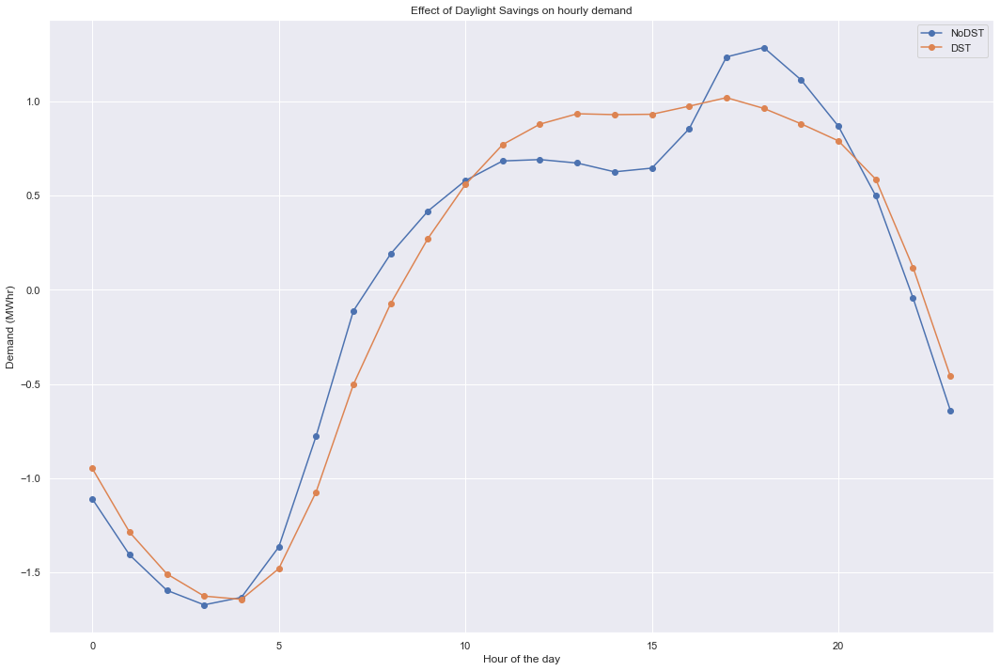

In [272]:
a1 = data.query('dst_index=="NoDST"').groupby(['hour'])['demand'].mean()
a2 = data.query('dst_index=="DST"').groupby(['hour'])['demand'].mean()

a1 = (a1 - a1.mean())/a1.std()
a2 = (a2 - a2.mean())/a2.std()

plt.plot(a1,marker='o',label='NoDST');
plt.plot(a2,marker='o',label='DST');

plt.legend();
plt.ylabel('Demand (MWhr)');
plt.xlabel('Hour of the day');
plt.title('Effect of Daylight Savings on hourly demand');

### Anomaly detection using Isolation Forest

Here, we use the Isolation forest technique to detect outliers. We get the score from the model and plot the histogram to decide the tolerance to classify an outlier

In [127]:
anomaly_model = IsolationForest(random_state=42)
anomaly_model.fit(data[['demand',]]);
score = anomaly_model.decision_function(data[['demand','']])
data['score'] = score

ValueError: could not convert string to float: 'NotHot'

Based on the frequency plot, we can choose -0.20 as the tolerance. Any data point with a score of less than -0.20 is classified as an outlier.

In [ ]:
plt.hist(score, bins=50);

In [ ]:
data['outliers'] = pd.Series(data['score']).apply(lambda x: 'yes' if (x < -0.20) else 'no' )
display(data.query('outliers == "yes"').shape)

In [ ]:
fig = px.scatter(data.reset_index(), x='timestamp',y='demand',color='outliers',title='Demand Outliers')

fig.update_xaxes(
rangeslider_visible = True,
rangeselector=dict(
buttons=list([
    dict(step='all'),
    dict(count=2, label='2y',step='year',stepmode='backward'),
    dict(count=1, label='1y',step='year',stepmode='backward'),
    dict(count=6, label='6m',step='month',stepmode='backward'),
    dict(count=1, label="YTD", step="year", stepmode="todate")
])))
fig.show()